In [1]:
!git clone https://github.com/THU-MIG/yolov10.git
%cd yolov10

Cloning into 'yolov10'...
remote: Enumerating objects: 20338, done.
remote: Counting objects: 100% (3/3), done.
remote: Compressing objects: 100% (3/3), done.
remote: Total 20338 (delta 1), reused 0 (delta 0), pack-reused 20335 (from 2)
Receiving objects: 100% (20338/20338), 11.11 MiB | 22.43 MiB/s, done.
Resolving deltas: 100% (14353/14353), done.
/content/yolov10




> Add blockquote



In [2]:
!pip install -q .

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 69.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 36.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 55.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 65.6 MB/s eta 0:00:00


In [3]:
import os
import urllib.request
#Create a directory for the weights in the current working directory
weights_dir = os.path.join(os.getcwd(), 'weights')
os.makedirs(weights_dir, exist_ok = True)
#urls of the weights file
urls = ["https://github.com/THU-MIG/yolov10/releases/download/v1.1/yolov10n.pt",
        "https://github.com/THU-MIG/yolov10/releases/download/v1.1/yolov10s.pt",
        "https://github.com/THU-MIG/yolov10/releases/download/v1.1/yolov10m.pt",
        "https://github.com/THU-MIG/yolov10/releases/download/v1.1/yolov10b.pt",
        "https://github.com/THU-MIG/yolov10/releases/download/v1.1/yolov10l.pt",
        "https://github.com/THU-MIG/yolov10/releases/download/v1.1/yolov10x.pt"]

#Download each file
for url in urls:
  filename = os.path.basename(url)
  filepath = os.path.join(weights_dir, filename)
  urllib.request.urlretrieve(url, filepath)
  print(f"Downloaded: {filepath}")

Downloaded: /content/yolov10/weights/yolov10n.pt
Downloaded: /content/yolov10/weights/yolov10s.pt
Downloaded: /content/yolov10/weights/yolov10m.pt
Downloaded: /content/yolov10/weights/yolov10b.pt
Downloaded: /content/yolov10/weights/yolov10l.pt
Downloaded: /content/yolov10/weights/yolov10x.pt


In [4]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="qpzBEyJbqkVwousKm1bC")
project = rf.workspace("roboflow-universe-projects").project("license-plate-recognition-rxg4e")
version = project.version(8)
dataset = version.download("yolov8")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.2/85.2 kB 9.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 8.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 20.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 117.7 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.11.0.86
    Uninstalling opencv-python-headless-4.11.0.86:
      Successfully uninstalled opencv-python-headless-4.11.0.86
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to License-Plate-Recognition-8 in yolov8:: 100%|██████████| 112/112 [00:00<00:00, 6481.18it/s]


In [5]:
%cd '/content/yolov10'

/content/yolov10


In [13]:
!yolo task=detect mode=train epochs=120 batch=8 plots=True model='/content/yolov10/weights/yolov10x.pt' data='/content/yolov10/License-Plate-Recognition-8/data.yaml'

Traceback (most recent call last):
  File "/usr/local/bin/yolo", line 8, in <module>
    sys.exit(entrypoint())
             ^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/ultralytics/cfg/__init__.py", line 567, in entrypoint
    model = YOLOv10(model)
            ^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/ultralytics/models/yolov10/model.py", line 14, in __init__
    super().__init__(model=model, task=task, verbose=verbose)
  File "/usr/local/lib/python3.11/dist-packages/ultralytics/engine/model.py", line 141, in __init__
    self._load(model, task=task)
  File "/usr/local/lib/python3.11/dist-packages/ultralytics/engine/model.py", line 230, in _load
    self.model, self.ckpt = attempt_load_one_weight(weights)
                            ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/ultralytics/nn/tasks.py", line 807, in attempt_load_one_weight
    ckpt, weight = torch_safe_load(weight)  # load ckpt
                  

\##**Step 06: Examine Training Results**

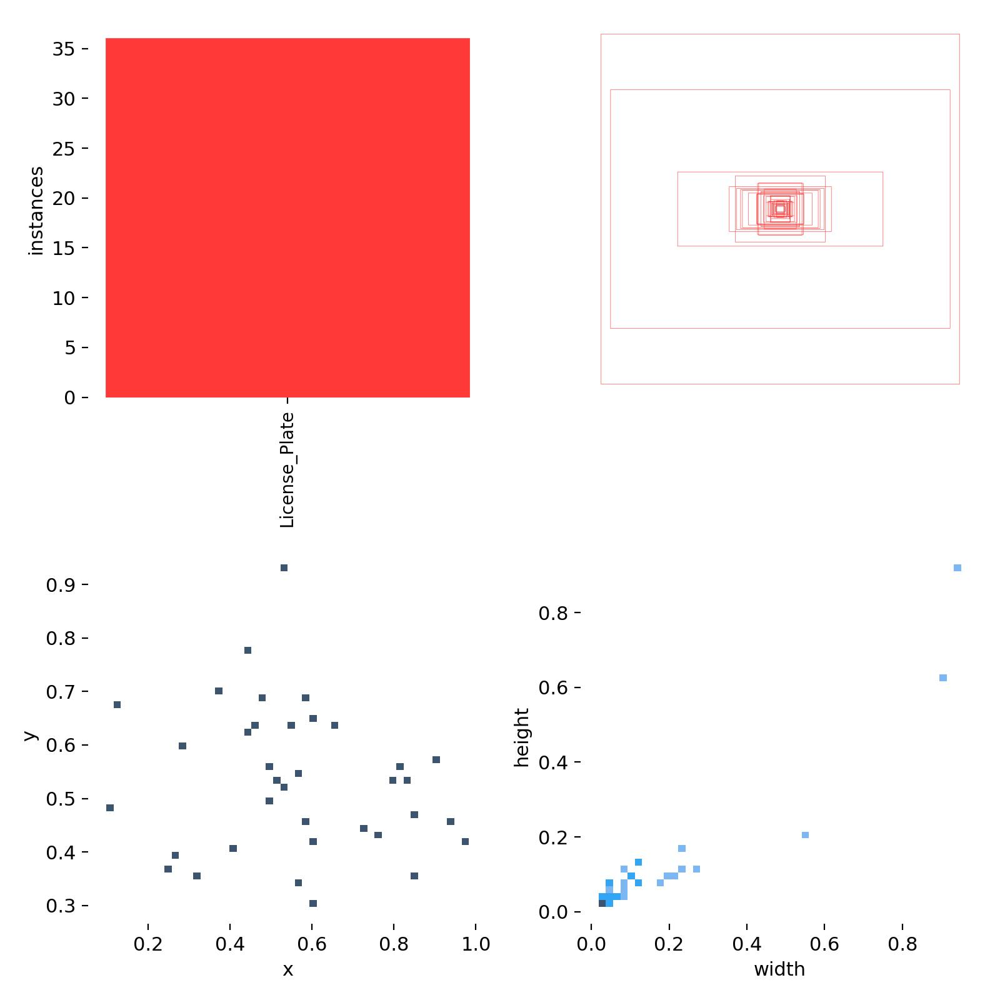

In [ ]:
from IPython.display import Image

Image("/content/yolov10/runs/detect/train6/labels.jpg")

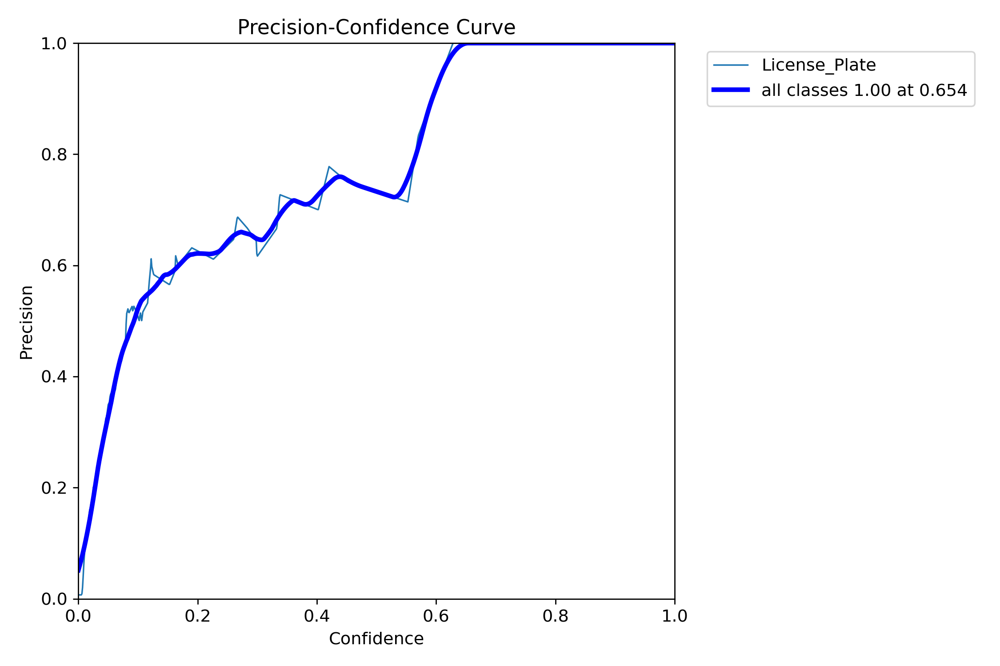

In [ ]:
Image("/content/yolov10/runs/detect/train4/P_curve.png")

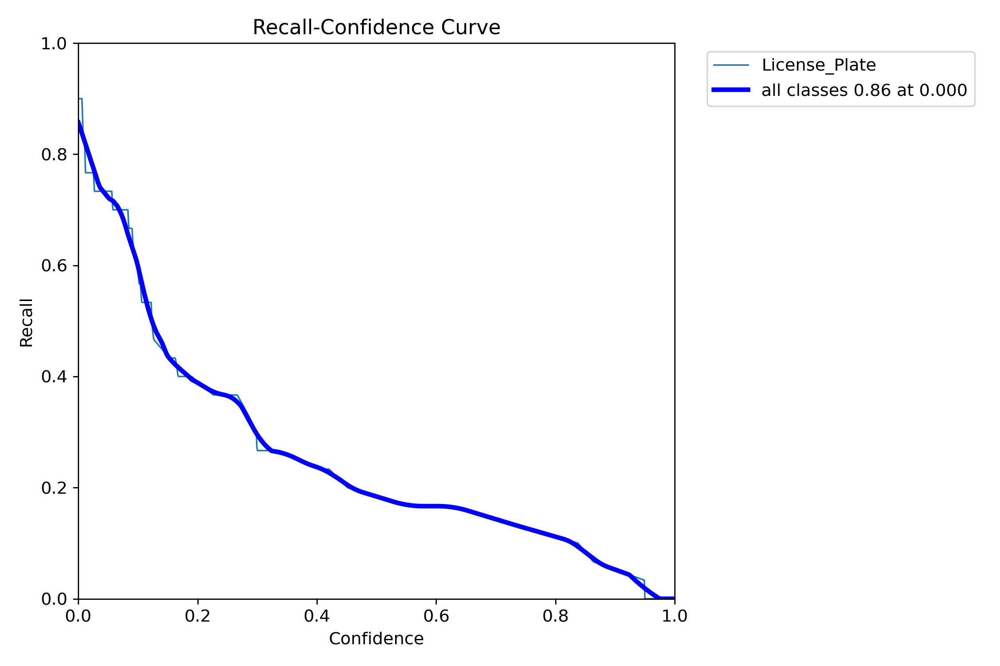

In [ ]:
Image("/content/yolov10/runs/detect/train4/R_curve.png")

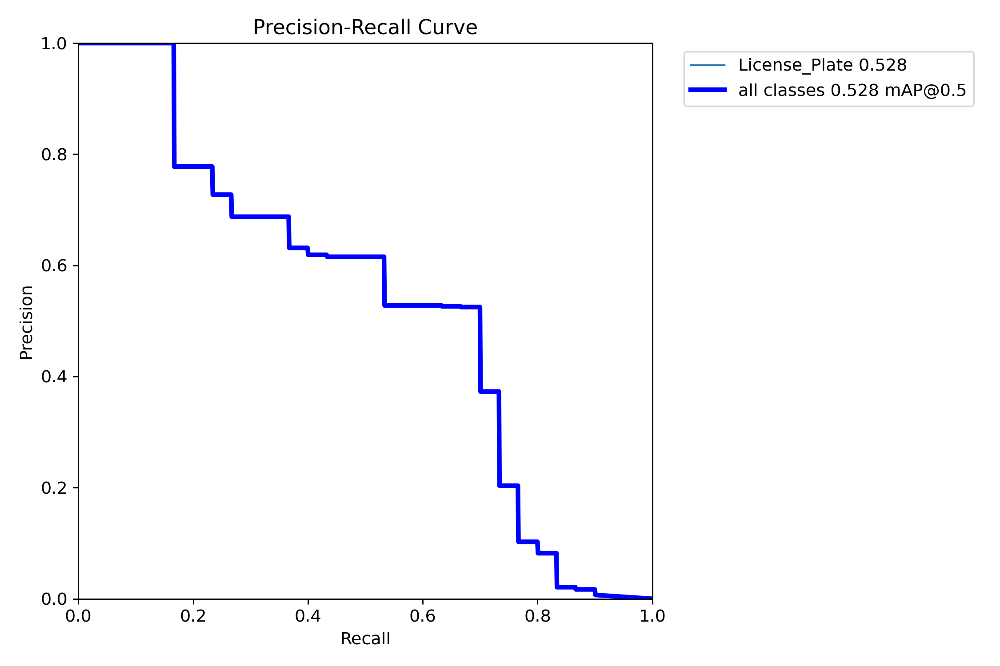

In [ ]:
Image("/content/yolov10/runs/detect/train4/PR_curve.png")

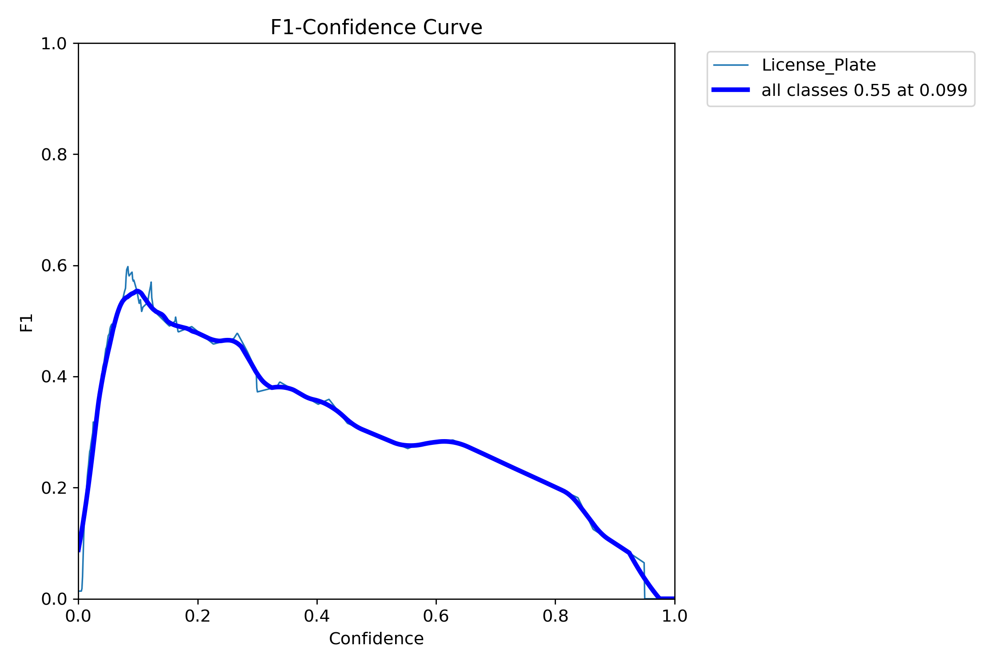

In [ ]:
Image("/content/yolov10/runs/detect/train4/F1_curve.png")

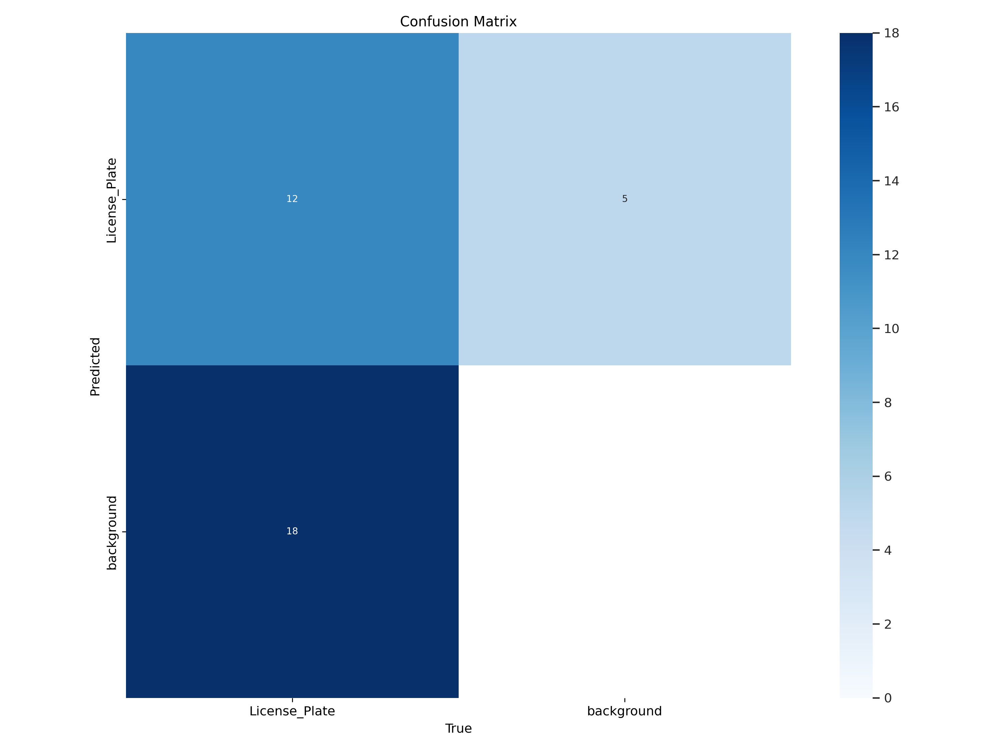

In [ ]:
Image("/content/yolov10/runs/detect/train4/confusion_matrix.png")

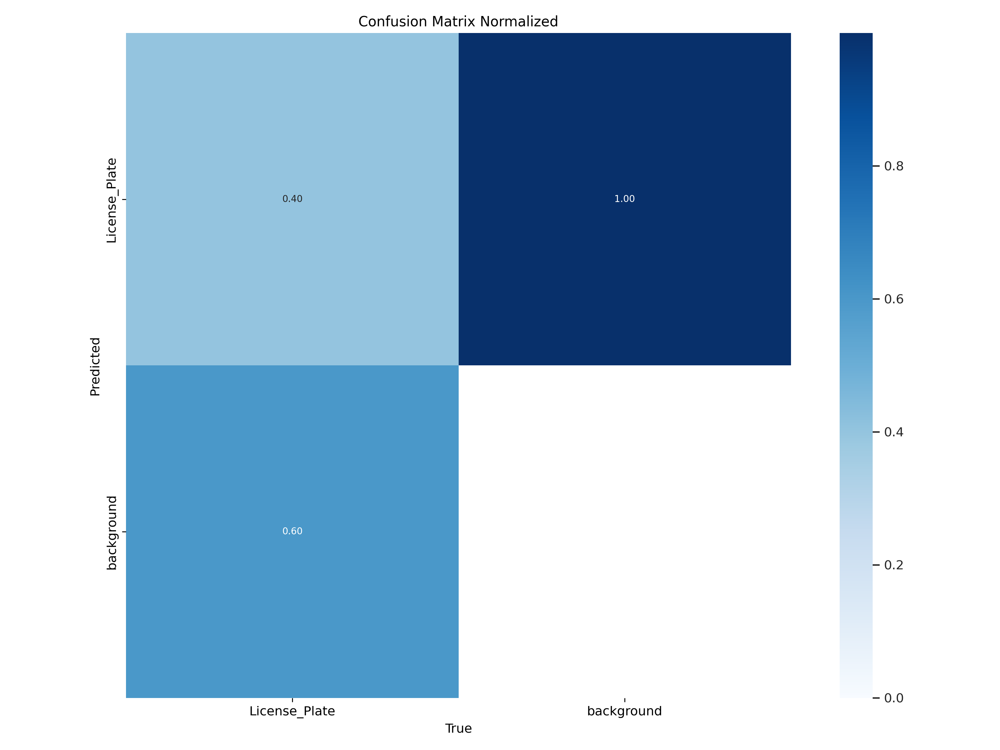

In [ ]:
Image("/content/yolov10/runs/detect/train4/confusion_matrix_normalized.png")

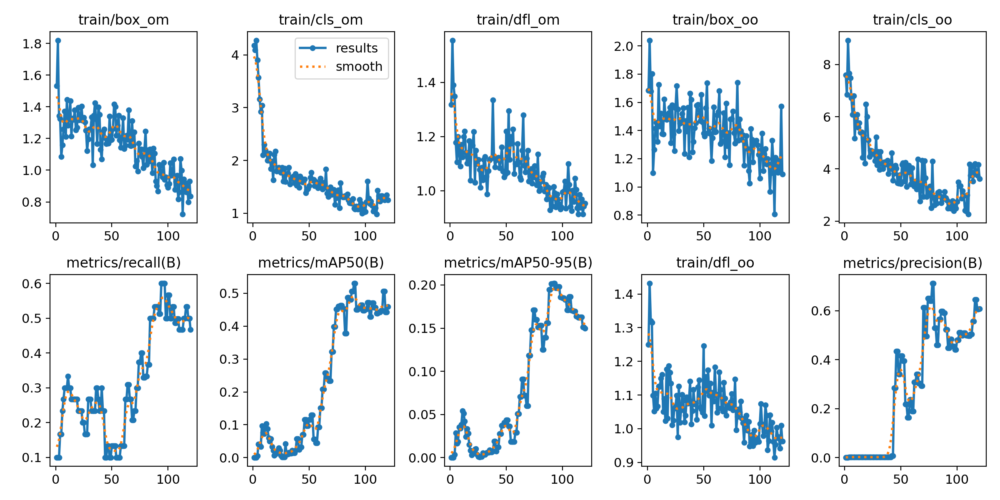

In [ ]:
Image("/content/yolov10/runs/detect/train4/results.png")

In [ ]:
Image("/content/yolov10/runs/detect/train6/train_batch0.jpg")

NameError: name 'Image' is not defined

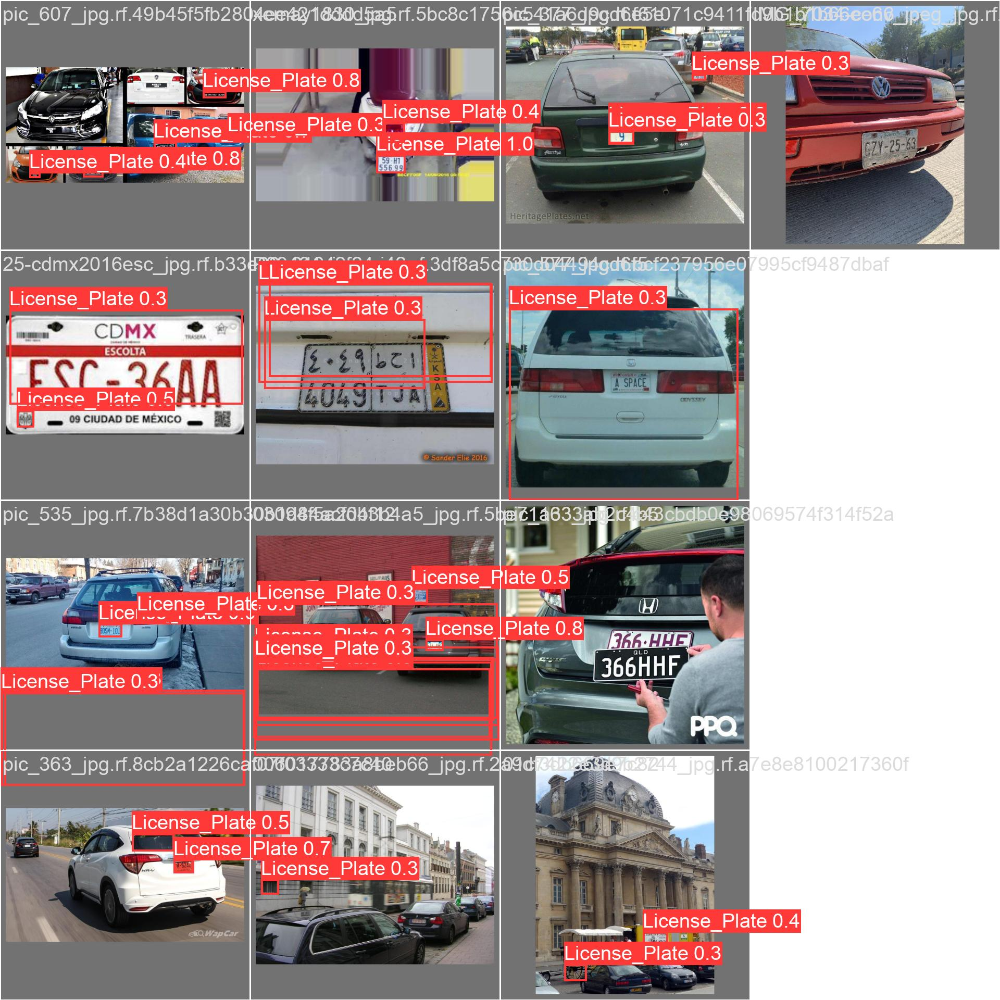

In [ ]:
Image("/content/yolov10/runs/detect/train6/val_batch0_pred.jpg")

In [ ]:
Image("/content/yolov10/runs/detect/train4/val_batch1_pred.jpg")

FileNotFoundError: No such file or directory: '/content/yolov10/runs/detect/train4/val_batch1_pred.jpg'

FileNotFoundError: No such file or directory: '/content/yolov10/runs/detect/train4/val_batch1_pred.jpg'

<IPython.core.display.Image object>

#**Step 07: Download the Model Weights from Drive**

In [ ]:
!gdown "https://drive.google.com/uc?id=132Wdk5jptRfgNoav8vePYk9chBwiDHDc&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=132Wdk5jptRfgNoav8vePYk9chBwiDHDc&confirm=t
To: /content/yolov10/best.pt
100% 5.77M/5.77M [00:00<00:00, 27.1MB/s]


#**Step 08: Inference on Image**

In [ ]:
!gdown "https://drive.google.com/uc?id=15wQmUQu4YnsinJswkDe7zr1QU5Ulue9O&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=15wQmUQu4YnsinJswkDe7zr1QU5Ulue9O&confirm=t
To: /content/yolov10/carImage1.png
100% 358k/358k [00:00<00:00, 125MB/s]


In [ ]:
!yolo task=detect mode=predict conf=0.25 save=True model='/content/yolov10/runs/detect/train4/weights/best.pt' source='/content/yolov10/License-Plate-Recognition-8/test/images/006a2f13b5b16c64_jpg.rf.1559f3f976bad6120d96f538829a549f.jpg'

/usr/local/lib/python3.10/dist-packages/ultralytics/nn/tasks.py:733: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(file, map_location="cpu")
Ultralytics YO

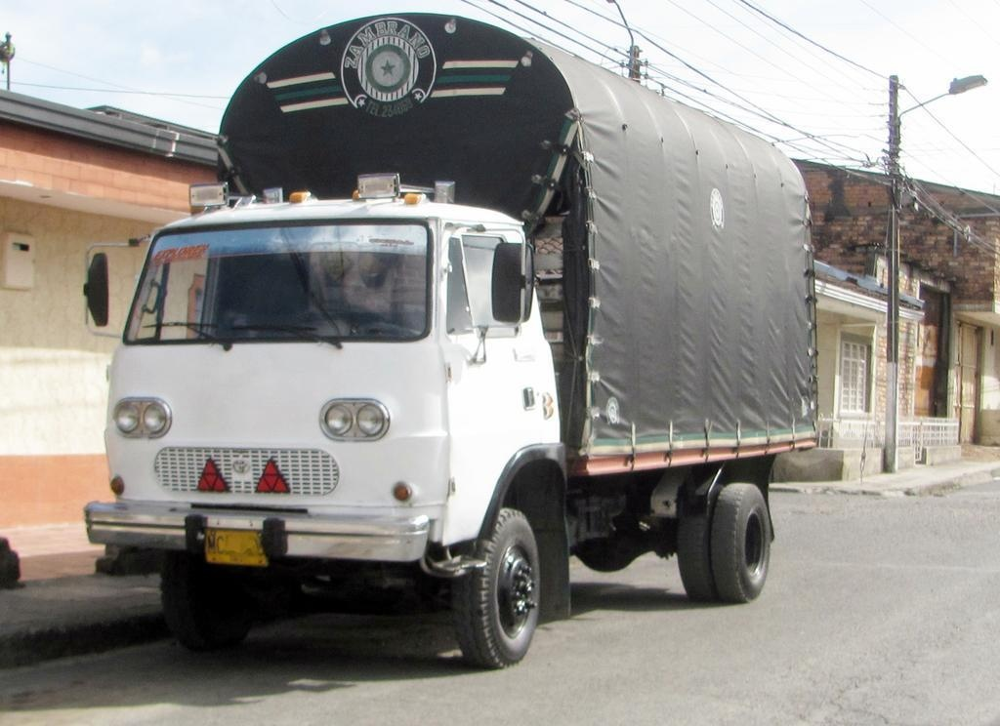

In [ ]:
from IPython.display import Image
Image(filename='/content/yolov10/runs/detect/predict2/006a2f13b5b16c64_jpg.rf.1559f3f976bad6120d96f538829a549f.jpg')


In [ ]:
!gdown "https://drive.google.com/uc?id=12X-xluoK8zK36F6mudICff2ZjgpQ6Qal&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=12X-xluoK8zK36F6mudICff2ZjgpQ6Qal&confirm=t
To: /content/yolov10/carImage2.png
100% 139k/139k [00:00<00:00, 85.3MB/s]


In [ ]:
!yolo task=detect mode=predict conf=0.25 save=True model='best.pt' source='carImage2.png'

Ultralytics YOLOv8.1.34 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv10n summary (fused): 285 layers, 2694806 parameters, 0 gradients, 8.2 GFLOPs

image 1/1 /content/yolov10/carImage2.png: 416x640 1 licence, 202.5ms
Speed: 3.7ms preprocess, 202.5ms inference, 203.1ms postprocess per image at shape (1, 3, 416, 640)
Results saved to /content/yolov10/runs/detect/predict4
💡 Learn more at https://docs.ultralytics.com/modes/predict


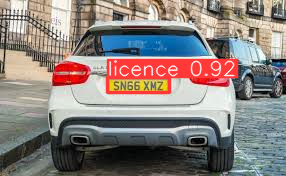

In [ ]:
from IPython.display import Image
Image(filename='runs/detect/predict4/carImage2.png')


#**Step 09: Download the Demo Videos**

In [ ]:
!gdown "https://drive.google.com/uc?id=11Cd4ScvMj3yAvYDrQBERj7Oz7oVGmMka&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=11Cd4ScvMj3yAvYDrQBERj7Oz7oVGmMka&confirm=t
To: /content/yolov10/1.mp4
100% 2.38M/2.38M [00:00<00:00, 145MB/s]


In [ ]:
!gdown "https://drive.google.com/uc?id=14CTYNzHsQJdnRbKdvB3bA_7CTzUrHHm9&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=14CTYNzHsQJdnRbKdvB3bA_7CTzUrHHm9&confirm=t
To: /content/yolov10/demo.mp4
100% 9.56M/9.56M [00:00<00:00, 31.9MB/s]


#**Step 10: Inference on Video**

In [ ]:
!yolo task=detect mode=predict conf=0.25 save=True model='best.pt' source='demo.mp4'

Ultralytics YOLOv8.1.34 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv10n summary (fused): 285 layers, 2694806 parameters, 0 gradients, 8.2 GFLOPs

video 1/1 (frame 1/631) /content/yolov10/demo.mp4: 416x640 1 licence, 92.1ms
video 1/1 (frame 2/631) /content/yolov10/demo.mp4: 416x640 2 licences, 10.0ms
video 1/1 (frame 3/631) /content/yolov10/demo.mp4: 416x640 3 licences, 10.2ms
video 1/1 (frame 4/631) /content/yolov10/demo.mp4: 416x640 2 licences, 10.6ms
video 1/1 (frame 5/631) /content/yolov10/demo.mp4: 416x640 1 licence, 10.4ms
video 1/1 (frame 6/631) /content/yolov10/demo.mp4: 416x640 1 licence, 11.0ms
video 1/1 (frame 7/631) /content/yolov10/demo.mp4: 416x640 3 licences, 10.5ms
video 1/1 (frame 8/631) /content/yolov10/demo.mp4: 416x640 2 licences, 10.3ms
video 1/1 (frame 9/631) /content/yolov10/demo.mp4: 416x640 2 licences, 14.4ms
video 1/1 (frame 10/631) /content/yolov10/demo.mp4: 416x640 1 licence, 14.1ms
video 1/1 (frame 11/631) /content/yolov10/demo.mp4: 4

#**Display the Output Video**

In [ ]:
!rm '/content/result_compressed.mp4'

rm: cannot remove '/content/result_compressed.mp4': No such file or directory


In [ ]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = 'runs/detect/predict5/demo.avi'

# Compressed video path
compressed_path = "/content/result_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

In [ ]:
!yolo task=detect mode=predict conf=0.25 save=True model='best.pt' source='1.mp4'

Ultralytics YOLOv8.1.34 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv10n summary (fused): 285 layers, 2694806 parameters, 0 gradients, 8.2 GFLOPs

video 1/1 (frame 1/140) /content/yolov10/1.mp4: 384x640 1 licence, 97.2ms
video 1/1 (frame 2/140) /content/yolov10/1.mp4: 384x640 1 licence, 16.9ms
video 1/1 (frame 3/140) /content/yolov10/1.mp4: 384x640 1 licence, 15.2ms
video 1/1 (frame 4/140) /content/yolov10/1.mp4: 384x640 1 licence, 13.2ms
video 1/1 (frame 5/140) /content/yolov10/1.mp4: 384x640 1 licence, 14.4ms
video 1/1 (frame 6/140) /content/yolov10/1.mp4: 384x640 1 licence, 13.8ms
video 1/1 (frame 7/140) /content/yolov10/1.mp4: 384x640 1 licence, 13.8ms
video 1/1 (frame 8/140) /content/yolov10/1.mp4: 384x640 (no detections), 13.3ms
video 1/1 (frame 9/140) /content/yolov10/1.mp4: 384x640 (no detections), 14.6ms
video 1/1 (frame 10/140) /content/yolov10/1.mp4: 384x640 1 licence, 13.0ms
video 1/1 (frame 11/140) /content/yolov10/1.mp4: 384x640 1 licence, 15.9ms
vi

In [ ]:
!rm '/content/result_compressed.mp4'

In [ ]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = 'runs/detect/predict6/1.avi'

# Compressed video path
compressed_path = "/content/result_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)